<a href="https://colab.research.google.com/github/NguyenAnhKietUIT/IS254.O11/blob/main/wikipedia/notebook/Decision_Support_System_Book_Recommendation_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Jupyter config

In [2]:
from IPython.core.interactiveshell import InteractiveShell

# Set shell to show all lines of output
InteractiveShell.ast_node_interactivity = 'all'

## Load data

In [3]:
import json

In [4]:
books = []

with open('/content/drive/MyDrive/Data/found_books_filtered.ndjson', 'r') as fin:
    # Append each line to the books
    books = [json.loads(l) for l in fin]

In [5]:
print(f'Found {len(books)} books.')

Found 37040 books.


## Data preprocessing

### Remove non-book articles

In [6]:
books_with_wikipedia = [book for book in books if 'Wikipedia:' in book[0]]
books = [book for book in books if 'Wikipedia:' not in book[0]]

In [7]:
print(f'Found {len(books_with_wikipedia)} Wikipedia books.')
print(f'Found {len(books)} books.')

Found 20 Wikipedia books.
Found 37020 books.


In [8]:
[book for book in books_with_wikipedia][:1]

[['Wikipedia:Wikipedia Signpost/2014-06-25/Recent research',
  {'name': 'Global Wikipedia',
   'author': 'Pnina Fichman and Noriko Hara',
   'country': 'United States',
   'language': 'English',
   'subject': 'Wikipedia',
   'publisher': 'Rowman  &  Littlefield',
   'release_date': '2014',
   'pages': '178',
   'isbn': '978-0810891012'},
  ['User:Adler.fa',
   'User:Maximilianklein',
   'User:Piotrus',
   'User:Kimaus',
   'User:Tbayer (WMF)',
   'Rowman  &  Littlefield',
   'Indiana University Bloomington',
   'User:Maximilianklein',
   'User talk:Maximilianklein',
   'File:Immanuel Kant (painted portrait).jpg',
   'Immanuel Kant',
   'PageRank',
   'CheiRank',
   'm:Research:Newsletter/2013/April#How_Wikipedia.27s_Google_matrix_differs_for_politicians_and_artists',
   'm:Research:Newsletter/2013/July#Multilingual_ranking_analysis:_Napoleon_and_Michael_Jackson_as_Wikipedia.27s_.22global_heroes.22',
   'DBpedia',
   'User:Piotrus',
   'OpenSym',
   'Chinese Wikipedia',
   'Baidu Baike'

In [10]:
n = 21

print("Book title:", books[n][0])
print("Book info:", books[n][1])
print("Book detail:", books[n][2])
print("Book links:", books[n][3])
print("Release date:", books[n][4])
print("Book page:", books[n][5])

Book title: Limonov (novel)
Book info: {'name': 'Limonov', 'author': 'Emmanuel Carrère', 'translator': 'John Lambert', 'country': 'France', 'language': 'French', 'publisher': 'P.O.L.', 'pub_date': '2011', 'english_pub_date': '2014', 'pages': '488', 'isbn': '978-2-8180-1405-9'}
Book detail: ['Emmanuel Carrère', 'biographical novel', 'Emmanuel Carrère', 'Eduard Limonov', 'Prix de la langue française', 'Prix Renaudot', '2011 in literature', 'Contemporary French literature', 'Category:2011 French novels', 'Category:French biographies', 'Category:Biographical novels', 'Category:National Bolshevism']
Book links: ['http://www.lefigaro.fr/flash-actu/2011/10/05/97001-20111005FILWWW00615-le-prix-de-la-langue-francaise-a-e-carrere.php', 'http://www.lexpress.fr/culture/livre/emmanuel-carrere-prix-renaudot-2011_1046819.html', 'http://limonow.de/carrere/index.html', 'http://www.tout-sur-limonov.fr/222318809']
Release date: 2018-08-18T02:03:21Z
Book page: 1437


### Map book - index

In [11]:
book_index = {book[0]: idx for idx, book in enumerate(books)}
index_book = {idx: book for book, idx in book_index.items()}

In [13]:
# Find the index of "Anna Karenina"
anna_karenina_index = book_index['Anna Karenina']
print("Index of 'Anna Karenina':", anna_karenina_index)

Index of 'Anna Karenina': 22494


In [14]:
# Find the book associated with index 22494
book_22494 = index_book[22494]
print("Book at index 22494:", book_22494)

Book at index 22494: Anna Karenina


### Flatten

In [15]:
from itertools import chain

In [16]:
wikilinks = list(chain(*[book[2] for book in books]))
print(f"There are {len(set(wikilinks))} unique wikilinks.")

There are 311276 unique wikilinks.


In [17]:
wikilinks_other_books = [link for link in wikilinks if link in book_index.keys()]
print(f"There are {len(set(wikilinks_other_books))} unique wikilinks to other books.")

There are 17032 unique wikilinks to other books.


In [22]:
from collections import Counter, OrderedDict

def count_items(l):
    """Return ordered dictionary of counts of objects in `l`"""

    # Create a counter object
    counts = Counter(l)

    # Sort by highest count first and place in ordered dictionary
    counts = sorted(counts.items(), key = lambda x: x[1], reverse = True)
    counts = OrderedDict(counts)

    return counts

In [25]:
# Find set of wikilinks for each book and convert to a flattened list
unique_wikilinks = list(chain(*[list(set(book[2])) for book in books]))

wikilink_counts = count_items(unique_wikilinks)
list(wikilink_counts.items())[:10]

[('Hardcover', 7489),
 ('Paperback', 7311),
 ('Wikipedia:WikiProject Books', 6043),
 ('Wikipedia:WikiProject Novels', 6015),
 ('English language', 4185),
 ('United States', 3060),
 ('Science fiction', 3030),
 ('The New York Times', 2727),
 ('science fiction', 2502),
 ('novel', 1979)]

In [26]:
wikilinks = [link.lower() for link in unique_wikilinks]
print(f"There are {len(set(wikilinks))} unique wikilinks.")

wikilink_counts = count_items(wikilinks)
list(wikilink_counts.items())[:5]

There are 297624 unique wikilinks.


[('paperback', 8740),
 ('hardcover', 8648),
 ('wikipedia:wikiproject books', 6043),
 ('wikipedia:wikiproject novels', 6016),
 ('science fiction', 5665)]

### Clean data

In [ ]:
to_remove = ['hardcover', 'paperback', 'hardback', 'e-book', 'wikipedia:wikiproject books', 'wikipedia:wikiproject novels']
for t in to_remove:
    wikilinks.remove(t)
    _ = wikilink_counts.pop(t)

In [ ]:
# Limit to greater than 3 links
links = [t[0] for t in wikilink_counts.items() if t[1] >= 4]
print(len(links))

41758


In [ ]:
# Find set of book wikilinks for each book
unique_wikilinks_books = list(chain(*[list(set(link for link in book[2] if link in book_index.keys())) for book in books]))

# Count the number of books linked to by other books
wikilink_book_counts = count_items(unique_wikilinks_books)
list(wikilink_book_counts.items())[:10]

[('The Encyclopedia of Science Fiction', 127),
 ('The Discontinuity Guide', 104),
 ('The Encyclopedia of Fantasy', 63),
 ('Dracula', 55),
 ('Encyclopædia Britannica', 51),
 ('Nineteen Eighty-Four', 51),
 ('Don Quixote', 49),
 ('The Wonderful Wizard of Oz', 49),
 ("Alice's Adventures in Wonderland", 47),
 ('Jane Eyre', 39)]

In [ ]:
for book in books:
    if 'The New York Times' in book[2] and 'New York Times' in book[2]:
        print(book[0], book[2])
        break

The Big Picture: Who Killed Hollywood? and Other Essays ['Wikipedia:WikiProject Novels', 'Wikipedia:WikiProject Books', 'William Goldman', 'United States', 'English language', 'William Goldman', 'Michael Sragow', 'Good Will Hunting', 'Robin Williams', 'Matt Damon', 'The New York Times', 'The New York Times Company', 'New York Times', 'Category:Cinema of the United States', 'Category:Film production', 'Category:2000 books', 'Category:Books about films', 'Category:Books by William Goldman', 'Category:Show business memoirs']


In [ ]:
wikilink_counts.get('the new york times')

2742

In [ ]:
wikilink_counts.get('new york times')

996

In [ ]:
link_index = {link: idx for idx, link in enumerate(links)}
index_link = {idx: link for link, idx in link_index.items()}

In [ ]:
print(link_index['the economist'])
print(index_link[300])
print(f'There are {len(link_index)} wikilinks that will be used.')

300
the economist
There are 41758 wikilinks that will be used.


# Supervised Machine Learning Task
Now that we have clean data, we'll move on to the second step: developing a supervised machine learning task to train an embedding neural network. As a reminder, we'll state the problem as: given a book title and a link, identify if the link is in the book's article.

## Preparing

In [ ]:
pairs = []

# Iterate through each book
for book in books:
    # Iterate through the links in the book
    pairs.extend((book_index[book[0]], link_index[link.lower()]) for link in book[2] if link.lower() in links)

In [ ]:
pairs[5000]

(321, 232)

In [ ]:
len(pairs), len(links), len(books)

(772798, 41758, 37020)

In [ ]:
index_book[pairs[5000][0]], index_link[pairs[5000][1]]

('Slaves in the Family', 'category:american biographies')

In [ ]:
index_book[pairs[900][0]], index_link[pairs[900][1]]

('The Man Who Watched the Trains Go By (novel)',
 'category:belgian novels adapted into films')

In [ ]:
pairs_set = set(pairs)

In [ ]:
x = Counter(pairs)
sorted(x.items(), key = lambda x: x[1], reverse = True)[:5]

[((13337, 31110), 85),
 ((31899, 65), 77),
 ((25899, 8851), 61),
 ((1851, 2629), 57),
 ((25899, 30465), 53)]

In [ ]:
index_book[13337], index_link[31111]
index_book[31899], index_link[65]
index_book[25899], index_link[30465]

("France's Songs of the Bards of the Tyne - 1850", 'robert nunn (songwriter)')

('The Early Stories: 1953–1975', 'the new yorker')

('Marthandavarma (novel)', 'kerala sahitya akademi')

In [ ]:
import numpy as np
import random

In [ ]:
random.seed(100)

def generate_batch(pairs, n_positive = 50, negative_ratio = 1.0, classification = False):
    """Generate batches of samples for training"""
    batch_size = n_positive * (1 + negative_ratio)
    batch = np.zeros((batch_size, 3))

    # Adjust label based on task
    if classification:
        neg_label = 0
    else:
        neg_label = -1

    # This creates a generator
    while True:
        # randomly choose positive examples
        for idx, (book_id, link_id) in enumerate(random.sample(pairs, n_positive)):
            batch[idx, :] = (book_id, link_id, 1)

        # Increment idx by 1
        idx += 1

        # Add negative examples until reach batch size
        while idx < batch_size:

            # random selection
            random_book = random.randrange(len(books))
            random_link = random.randrange(len(links))

            # Check to make sure this is not a positive example
            if (random_book, random_link) not in pairs_set:

                # Add to batch and increment index
                batch[idx, :] = (random_book, random_link, neg_label)
                idx += 1

        # Make sure to shuffle order
        np.random.shuffle(batch)
        yield {'book': batch[:, 0], 'link': batch[:, 1]}, batch[:, 2]

In [ ]:
next(generate_batch(pairs, n_positive = 2, negative_ratio = 2))

({'book': array([22162., 28410., 29814.,  7206., 25757.,  6895.]),
  'link': array([ 5588., 33217., 11452., 34924., 22920.,   260.])},
 array([ 1., -1., -1., -1., -1.,  1.]))

In [ ]:
x, y = next(generate_batch(pairs, n_positive = 2, negative_ratio = 2))

# Show a few example training pairs
for label, b_idx, l_idx in zip(y, x['book'], x['link']):
    print(f'Book: {index_book[b_idx]:30} Link: {index_link[l_idx]:40} Label: {label}')

Book: Soul Music (novel)             Link: peter crowther                           Label: -1.0
Book: Bag of Bones                   Link: category:novels by stephen king          Label: 1.0
Book: Deep Six (novel)               Link: president of the united states           Label: 1.0
Book: The Counterfeit Man            Link: gerald gardner (wiccan)                  Label: -1.0
Book: Des Imagistes                  Link: august strindberg                        Label: -1.0
Book: The Soul of the Robot          Link: kristin cast                             Label: -1.0


## Embedding

In [ ]:
from keras.layers import Input, Embedding, Dot, Reshape, Dense
from keras.models import Model

In [ ]:
def book_embedding_model(embedding_size = 50, classification = False):
    """Model to embed books and wikilinks using the functional API.
       Trained to discern if a link is present in a article"""

    # Both inputs are 1-dimensional
    book = Input(name = 'book', shape = [1])
    link = Input(name = 'link', shape = [1])

    # Embedding the book (shape will be (None, 1, 50))
    book_embedding = Embedding(name = 'book_embedding',
                               input_dim = len(book_index),
                               output_dim = embedding_size)(book)

    # Embedding the link (shape will be (None, 1, 50))
    link_embedding = Embedding(name = 'link_embedding',
                               input_dim = len(link_index),
                               output_dim = embedding_size)(link)

    # Merge the layers with a dot product along the second axis (shape will be (None, 1, 1))
    merged = Dot(name = 'dot_product', normalize = True, axes = 2)([book_embedding, link_embedding])

    # Reshape to be a single number (shape will be (None, 1))
    merged = Reshape(target_shape = [1])(merged)

    # If classifcation, add extra layer and loss function is binary cross entropy
    if classification:
        merged = Dense(1, activation = 'sigmoid')(merged)
        model = Model(inputs = [book, link], outputs = merged)
        model.compile(optimizer = 'Adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

    # Otherwise loss function is mean squared error
    else:
        model = Model(inputs = [book, link], outputs = merged)
        model.compile(optimizer = 'Adam', loss = 'mse')

    return model

In [ ]:
# Instantiate model and show parameters
model = book_embedding_model()
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 book (InputLayer)           [(None, 1)]                  0         []                            
                                                                                                  
 link (InputLayer)           [(None, 1)]                  0         []                            
                                                                                                  
 book_embedding (Embedding)  (None, 1, 50)                1851000   ['book[0][0]']                
                                                                                                  
 link_embedding (Embedding)  (None, 1, 50)                2087900   ['link[0][0]']                
                                                                                            

## Training

In [ ]:
n_positive = 1024

gen = generate_batch(pairs, n_positive, negative_ratio = 2)

# Train
h = model.fit_generator(gen, epochs = 15,
                        steps_per_epoch = len(pairs) // n_positive,
                        verbose = 2)

Epoch 1/15


<ipython-input-43-fbc6e88c7b0e>:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  h = model.fit_generator(gen, epochs = 15,


754/754 - 41s - loss: 0.9574 - 41s/epoch - 54ms/step
Epoch 2/15
754/754 - 13s - loss: 0.7261 - 13s/epoch - 17ms/step
Epoch 3/15
754/754 - 9s - loss: 0.5052 - 9s/epoch - 12ms/step
Epoch 4/15
754/754 - 12s - loss: 0.4628 - 12s/epoch - 16ms/step
Epoch 5/15
754/754 - 12s - loss: 0.4451 - 12s/epoch - 16ms/step
Epoch 6/15
754/754 - 10s - loss: 0.4356 - 10s/epoch - 13ms/step
Epoch 7/15
754/754 - 12s - loss: 0.4294 - 12s/epoch - 15ms/step
Epoch 8/15
754/754 - 12s - loss: 0.4251 - 12s/epoch - 16ms/step
Epoch 9/15
754/754 - 10s - loss: 0.4217 - 10s/epoch - 13ms/step
Epoch 10/15
754/754 - 11s - loss: 0.4194 - 11s/epoch - 14ms/step
Epoch 11/15
754/754 - 12s - loss: 0.4168 - 12s/epoch - 16ms/step
Epoch 12/15
754/754 - 11s - loss: 0.4153 - 11s/epoch - 15ms/step
Epoch 13/15
754/754 - 10s - loss: 0.4135 - 10s/epoch - 14ms/step
Epoch 14/15
754/754 - 12s - loss: 0.4124 - 12s/epoch - 16ms/step
Epoch 15/15
754/754 - 11s - loss: 0.4108 - 11s/epoch - 14ms/step


In [ ]:
model.save('/content/drive/MyDrive/Model/first_attempt.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Preview model

In [ ]:
from keras.models import load_model

In [ ]:
model = load_model('/content/drive/MyDrive/Model/first_attempt.h5')

In [ ]:
# Extract embeddings
book_layer = model.get_layer('book_embedding')
book_weights = book_layer.get_weights()[0]
book_weights.shape

(37020, 50)

In [ ]:
book_weights = book_weights / np.linalg.norm(book_weights, axis = 1).reshape((-1, 1))
book_weights[0][:10]
np.sum(np.square(book_weights[0]))

array([ 0.09554873,  0.19300374, -0.34289137,  0.1280505 , -0.19762231,
        0.06800136, -0.256259  , -0.03315121,  0.02940012, -0.13780698],
      dtype=float32)

0.99999994

## Testing

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
plt.rcParams['font.size'] = 15

In [ ]:
def find_similar(name, weights, index_name = 'book', n = 10, least = False, return_dist = False, plot = False):
    """Find n most similar items (or least) to name based on embeddings. Option to also plot the results"""

    # Select index and reverse index
    if index_name == 'book':
        index = book_index
        rindex = index_book
    elif index_name == 'page':
        index = link_index
        rindex = index_link

    # Check to make sure `name` is in index
    try:
        # Calculate dot product between book and all others
        dists = np.dot(weights, weights[index[name]])
    except KeyError:
        print(f'{name} Not Found.')
        return

    # Sort distance indexes from smallest to largest
    sorted_dists = np.argsort(dists)

    # Plot results if specified
    if plot:

        # Find furthest and closest items
        furthest = sorted_dists[:(n // 2)]
        closest = sorted_dists[-n-1: len(dists) - 1]
        items = [rindex[c] for c in furthest]
        items.extend(rindex[c] for c in closest)

        # Find furthest and closets distances
        distances = [dists[c] for c in furthest]
        distances.extend(dists[c] for c in closest)

        colors = ['r' for _ in range(n //2)]
        colors.extend('g' for _ in range(n))

        data = pd.DataFrame({'distance': distances}, index = items)

        # Horizontal bar chart
        data['distance'].plot.barh(color = colors, figsize = (10, 8),
                                   edgecolor = 'k', linewidth = 2)
        plt.xlabel('Cosine Similarity');
        plt.axvline(x = 0, color = 'k');

        # Formatting for italicized title
        name_str = f'{index_name.capitalize()}s Most and Least Similar to'
        for word in name.split():
            # Title uses latex for italize
            name_str += ' $\it{' + word + '}$'
        plt.title(name_str, x = 0.2, size = 28, y = 1.05)

        return None

    # If specified, find the least similar
    if least:
        # Take the first n from sorted distances
        closest = sorted_dists[:n]

        print(f'{index_name.capitalize()}s furthest from {name}.\n')

    # Otherwise find the most similar
    else:
        # Take the last n sorted distances
        closest = sorted_dists[-n:]

        # Need distances later on
        if return_dist:
            return dists, closest


        print(f'{index_name.capitalize()}s closest to {name}.\n')

    # Need distances later on
    if return_dist:
        return dists, closest


    # Print formatting
    max_width = max([len(rindex[c]) for c in closest])

    # Print the most similar and distances
    for c in reversed(closest):
        print(f'{index_name.capitalize()}: {rindex[c]:{max_width + 2}} Similarity: {dists[c]:.{2}}')

In [ ]:
find_similar('War and Peace', book_weights)

Books closest to War and Peace.

Book: War and Peace               Similarity: 1.0
Book: Anna Karenina               Similarity: 0.93
Book: The Master and Margarita    Similarity: 0.92
Book: Demons (Dostoevsky novel)   Similarity: 0.91
Book: Dead Souls                  Similarity: 0.88
Book: Crime and Punishment        Similarity: 0.88
Book: The Idiot                   Similarity: 0.87
Book: Eugene Onegin               Similarity: 0.87
Book: Poor Folk                   Similarity: 0.86
Book: Buddenbrooks                Similarity: 0.85


In [ ]:
find_similar('War and Peace', book_weights, least = True, n = 5)

Books furthest from War and Peace.

Book: Tales from Jabba's Palace       Similarity: -0.55
Book: Transformers: Exiles            Similarity: -0.55
Book: First Rider's Call              Similarity: -0.56
Book: Preludes (Dragonlance series)   Similarity: -0.56
Book: Lords of Darkness               Similarity: -0.58


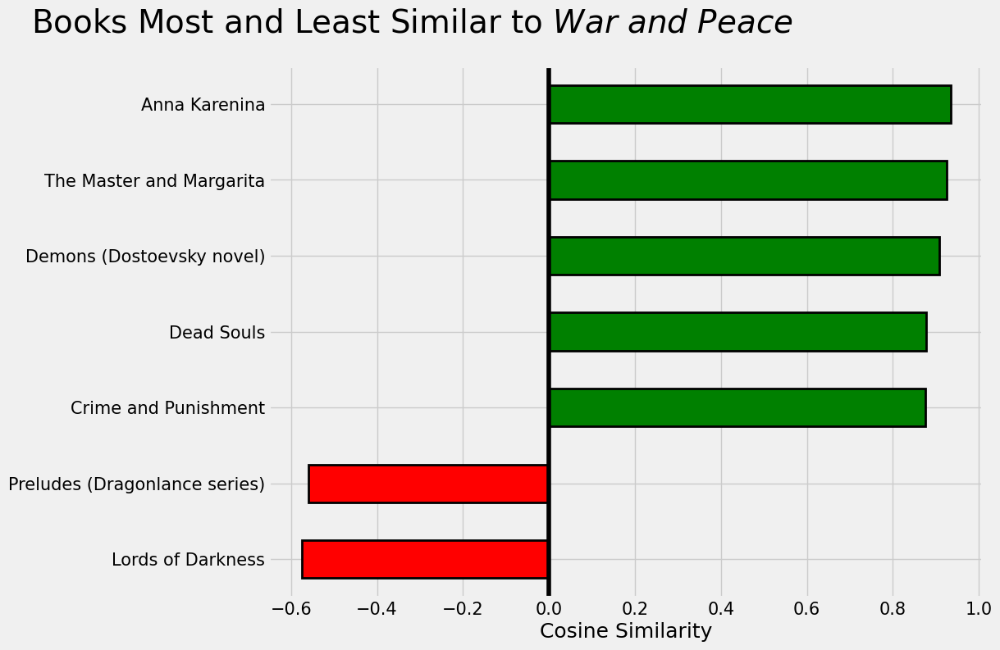

In [ ]:
find_similar('War and Peace', book_weights, n = 5, plot = True)

In [ ]:
find_similar('The Fellowship of the Ring', book_weights, n = 7)

Books closest to The Fellowship of the Ring.

Book: The Fellowship of the Ring   Similarity: 1.0
Book: The Return of the King       Similarity: 0.96
Book: The Silmarillion             Similarity: 0.93
Book: The Two Towers               Similarity: 0.92
Book: Beren and Lúthien            Similarity: 0.89
Book: Bored of the Rings           Similarity: 0.87
Book: The Children of Húrin        Similarity: 0.86


In [ ]:
find_similar('Artificial Intelligence: A Modern Approach', book_weights, n = 5)

Books closest to Artificial Intelligence: A Modern Approach.

Book: Artificial Intelligence: A Modern Approach            Similarity: 1.0
Book: Structure and Interpretation of Classical Mechanics   Similarity: 0.96
Book: TCP/IP Illustrated                                    Similarity: 0.96
Book: Structure and Interpretation of Computer Programs     Similarity: 0.96
Book: Computer Graphics: Principles and Practice            Similarity: 0.95


In [ ]:
find_similar('Weapons of Math Destruction', book_weights, n = 5)

Books closest to Weapons of Math Destruction.

Book: Weapons of Math Destruction      Similarity: 1.0
Book: The Alchemy of Race and Rights   Similarity: 0.96
Book: Hurst's the Heart                Similarity: 0.95
Book: I Have Landed                    Similarity: 0.95
Book: The Soul of a New Machine        Similarity: 0.94


In [ ]:
find_similar('Bully for Brontosaurus', book_weights, n = 5)

Books closest to Bully for Brontosaurus.

Book: Bully for Brontosaurus                                           Similarity: 1.0
Book: Eight Little Piggies                                             Similarity: 0.96
Book: Ever Since Darwin                                                Similarity: 0.96
Book: I Have Landed                                                    Similarity: 0.96
Book: Fashion, Faith, and Fantasy in the New Physics of the Universe   Similarity: 0.96


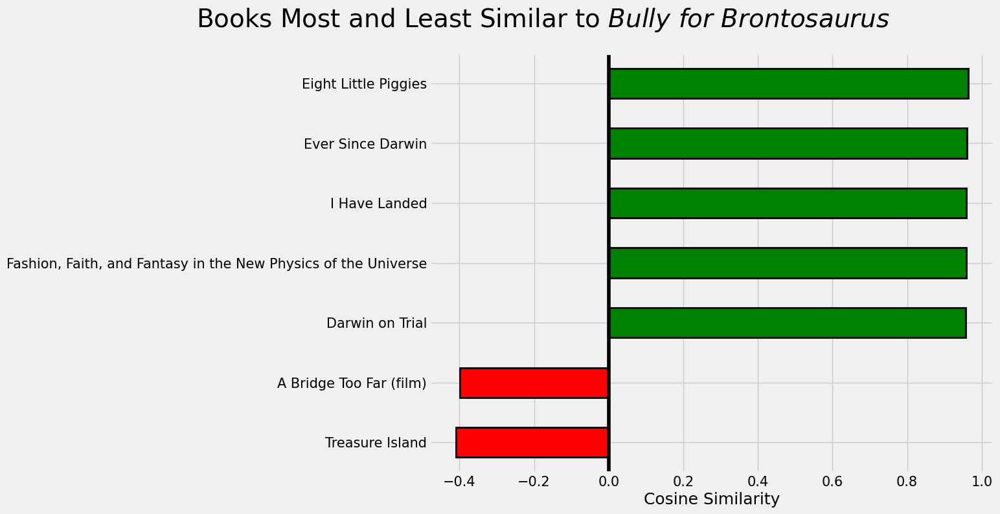

In [ ]:
find_similar('Bully for Brontosaurus', book_weights, n = 5, plot = True)

In [ ]:
def extract_weights(name, model):
    """Extract weights from a neural network model"""

    # Extract weights
    weight_layer = model.get_layer(name)
    weights = weight_layer.get_weights()[0]

    # Normalize
    weights = weights / np.linalg.norm(weights, axis = 1).reshape((-1, 1))
    return weights

In [ ]:
link_weights = extract_weights('link_embedding', model)

In [ ]:
find_similar('science fiction', link_weights, index_name = 'page')

Pages closest to science fiction.

Page: science fiction                            Similarity: 1.0
Page: category:american science fiction novels   Similarity: 0.98
Page: tor books                                  Similarity: 0.93
Page: bantam books                               Similarity: 0.92
Page: category:doubleday (publisher) books       Similarity: 0.9
Page: ballantine books                           Similarity: 0.9
Page: anthology                                  Similarity: 0.89
Page: victor gollancz ltd                        Similarity: 0.89
Page: fantasy                                    Similarity: 0.87
Page: berkley books                              Similarity: 0.87


In [ ]:
find_similar('biography', link_weights, index_name = 'page')

Pages closest to biography.

Page: biography                             Similarity: 1.0
Page: autobiography                         Similarity: 0.94
Page: category:american non-fiction books   Similarity: 0.94
Page: non-fiction                           Similarity: 0.93
Page: category:2003 books                   Similarity: 0.92
Page: category:2007 books                   Similarity: 0.9
Page: category:2005 books                   Similarity: 0.9
Page: category:english-language books       Similarity: 0.9
Page: memoir                                Similarity: 0.9
Page: category:2010 non-fiction books       Similarity: 0.89


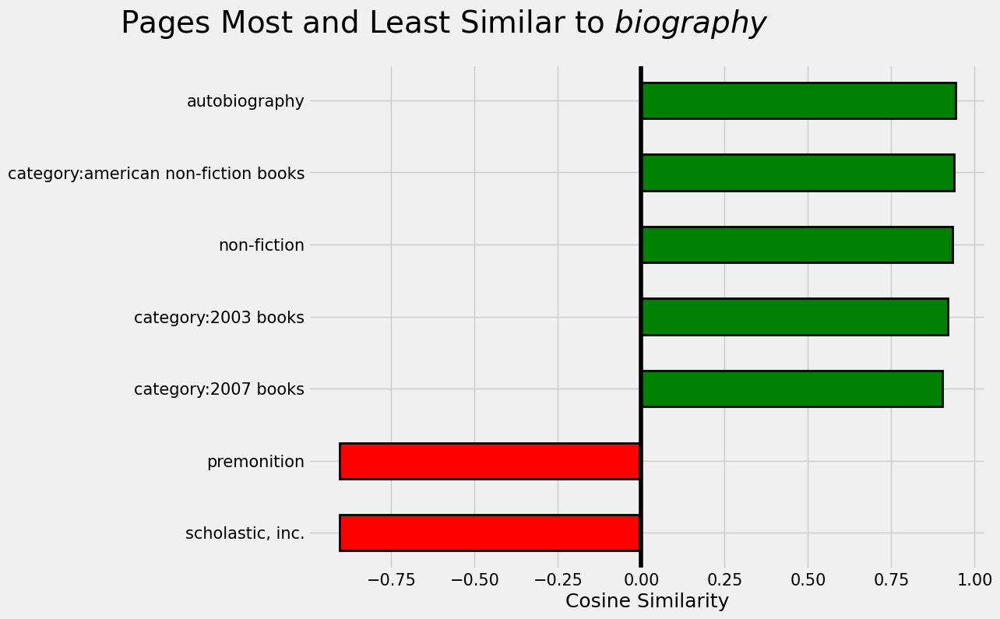

In [ ]:
find_similar('biography', link_weights, index_name = 'page', n = 5, plot = True)

In [ ]:
find_similar('new york city', link_weights, index_name = 'page', n = 5)

Pages closest to new york city.

Page: new york city                 Similarity: 1.0
Page: the new york times            Similarity: 0.97
Page: alfred a. knopf               Similarity: 0.96
Page: new york times                Similarity: 0.95
Page: category:random house books   Similarity: 0.95


## Embedding class

In [ ]:
model_class = book_embedding_model(50, classification = True)
gen = generate_batch(pairs, n_positive, negative_ratio=2, classification = True)

In [ ]:
# Train the model to learn embeddings
h = model_class.fit_generator(gen, epochs = 15, steps_per_epoch= len(pairs) // n_positive,
                            verbose = 0)

<ipython-input-66-84630604888e>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  h = model_class.fit_generator(gen, epochs = 15, steps_per_epoch= len(pairs) // n_positive,


In [ ]:
model_class.save('/content/drive/MyDrive/Model/first_attempt_class.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## EC Testing

In [ ]:
modelLoaded = load_model('/content/drive/MyDrive/Model/first_attempt_class.h5')

In [ ]:
book_weights_class = extract_weights('book_embedding', modelLoaded)
book_weights_class.shape

(37020, 50)

In [ ]:
find_similar('War and Peace', book_weights_class, n = 5)

Books closest to War and Peace.

Book: War and Peace              Similarity: 1.0
Book: The Master and Margarita   Similarity: 0.8
Book: Anna Karenina              Similarity: 0.79
Book: Dead Souls                 Similarity: 0.75
Book: The Brothers Karamazov     Similarity: 0.69


In [ ]:
find_similar('The Fellowship of the Ring', book_weights_class, n = 5)

Books closest to The Fellowship of the Ring.

Book: The Fellowship of the Ring   Similarity: 1.0
Book: The Two Towers               Similarity: 0.93
Book: The Return of the King       Similarity: 0.9
Book: The Fall of Gondolin         Similarity: 0.84
Book: The Silmarillion             Similarity: 0.83


In [ ]:
find_similar('The Better Angels of Our Nature', book_weights_class, n = 5)

Books closest to The Better Angels of Our Nature.

Book: The Better Angels of Our Nature   Similarity: 1.0
Book: Enlightenment Now                 Similarity: 0.76
Book: The Bell Curve                    Similarity: 0.73
Book: A Natural History of Rape         Similarity: 0.73
Book: The Moral Landscape               Similarity: 0.71


In [ ]:
link_weights_class = extract_weights('link_embedding', model_class)

In [ ]:
find_similar('the washington post', link_weights_class, index_name = 'page', n = 5)

Pages closest to the washington post.

Page: the washington post   Similarity: 1.0
Page: los angeles times     Similarity: 0.95
Page: the new york times    Similarity: 0.93
Page: washington post       Similarity: 0.93
Page: new york times        Similarity: 0.92


In [ ]:
find_similar('category:almanacs', link_weights_class, index_name = 'page', n = 5)

Pages closest to category:almanacs.

Page: category:almanacs             Similarity: 1.0
Page: almanac                       Similarity: 0.68
Page: crc press                     Similarity: 0.67
Page: american airlines flight 77   Similarity: 0.66
Page: failed state                  Similarity: 0.65


In [ ]:
find_similar('steven pinker', link_weights_class, index_name = 'page', n = 5)

Pages closest to steven pinker.

Page: steven pinker             Similarity: 1.0
Page: h. allen orr              Similarity: 0.83
Page: sociobiology              Similarity: 0.81
Page: michael ruse              Similarity: 0.81
Page: evolutionary psychology   Similarity: 0.79


In [ ]:
find_similar('richard dawkins', link_weights_class, index_name = 'page', n = 5)

Pages closest to richard dawkins.

Page: richard dawkins        Similarity: 1.0
Page: stephen jay gould      Similarity: 0.79
Page: michael ruse           Similarity: 0.79
Page: the blind watchmaker   Similarity: 0.76
Page: creationism            Similarity: 0.76


# Visualizations

## Manifold Embeddings

In [ ]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=7194a30d4104e789a6890e9b7ba27c3f150f00e39f06f403990e44b9112b8c18
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=64ef32112f6cf79d5017164b238de73b65411386bdbb3793aa8e6681838156b3
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [ ]:
from sklearn.manifold import TSNE
from umap import UMAP

In [ ]:
def reduce_dim(weights, components = 3, method = 'tsne'):
    """Reduce dimensions of embeddings"""
    if method == 'tsne':
        return TSNE(components, metric = 'cosine').fit_transform(weights)
    elif method == 'umap':
        # Might want to try different parameters for UMAP
        return UMAP(n_components=components, metric = 'cosine',
                    init = 'random', n_neighbors = 5).fit_transform(weights)

In [ ]:
book_r = reduce_dim(book_weights_class, components = 2, method = 'tsne')
book_r.shape

(37020, 2)

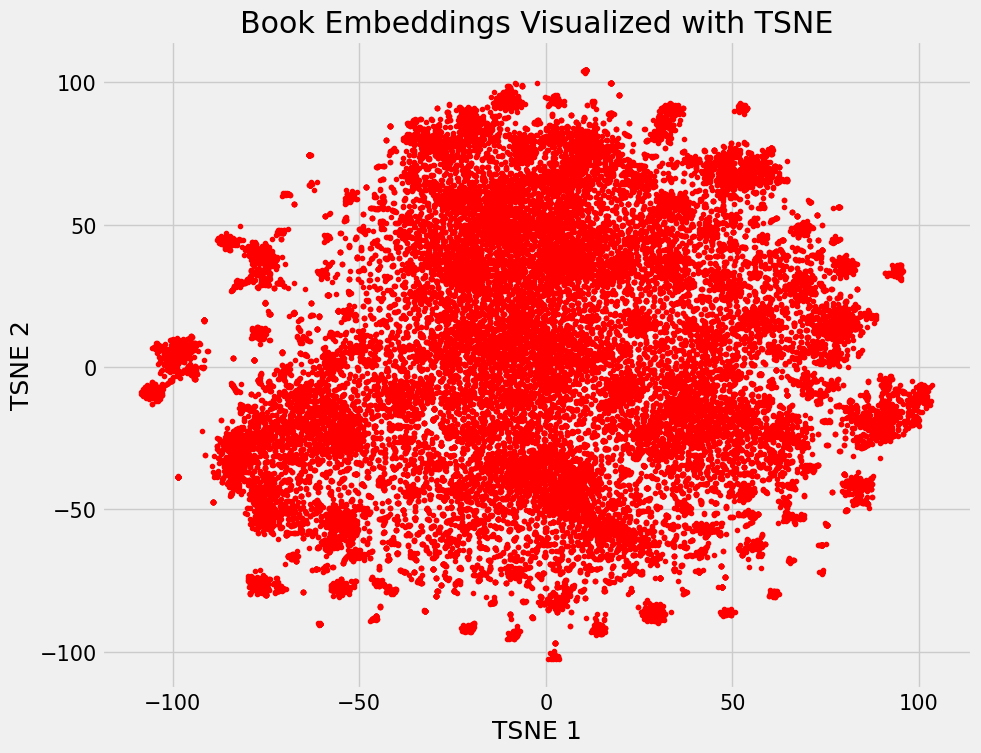

In [ ]:
InteractiveShell.ast_node_interactivity = 'last'

plt.figure(figsize = (10, 8))
plt.plot(book_r[:, 0], book_r[:, 1], 'r.')
plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2'); plt.title('Book Embeddings Visualized with TSNE');

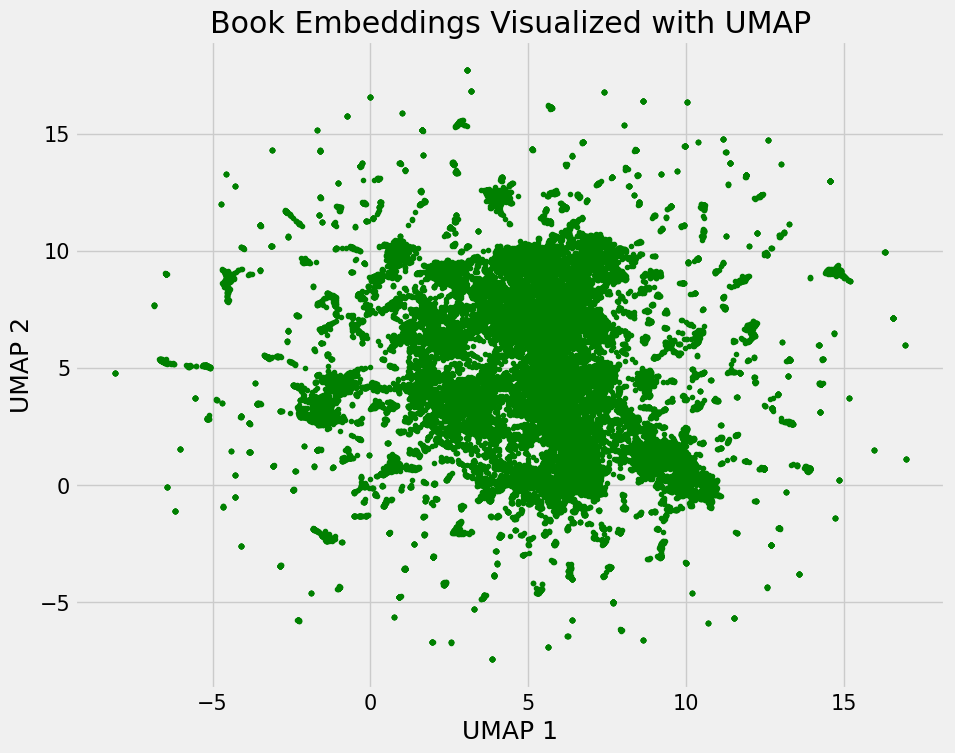

In [ ]:
book_ru = reduce_dim(book_weights_class, components = 2, method = 'umap')

plt.figure(figsize = (10, 8))
plt.plot(book_ru[:, 0], book_ru[:, 1], 'g.');
plt.xlabel('UMAP 1'); plt.ylabel('UMAP 2'); plt.title('Book Embeddings Visualized with UMAP');

In [ ]:
info = list(chain(*[set(book[1]) for book in books]))
info_counts = count_items(info)
list(info_counts.items())[:10]

[('name', 36400),
 ('author', 35557),
 ('language', 32869),
 ('country', 30693),
 ('publisher', 30618),
 ('image', 28751),
 ('pages', 26090),
 ('media_type', 26016),
 ('genre', 25966),
 ('isbn', 24934)]

In [ ]:
genres = [book[1].get('genre', 'None').lower() for book in books]

# Remove genres not found
genre_counts = count_items(genres)
del genre_counts['none']
list(genre_counts.items())[:10]

[('science fiction', 2177),
 ('novel', 1641),
 ('non-fiction', 1270),
 ('fantasy', 974),
 ('fantasy novel', 780),
 ('historical novel', 582),
 ('science fiction novel', 571),
 ('fiction', 559),
 ('crime novel', 424),
 ("children's novel", 313)]

In [ ]:
genres = [book[1].get('genre', 'None').lower() for book in books]

# Remove genres not found
genre_counts = count_items(genres)
del genre_counts['none']
list(genre_counts.items())[:10]

[('science fiction', 2177),
 ('novel', 1641),
 ('non-fiction', 1270),
 ('fantasy', 974),
 ('fantasy novel', 780),
 ('historical novel', 582),
 ('science fiction novel', 571),
 ('fiction', 559),
 ('crime novel', 424),
 ("children's novel", 313)]

In [ ]:
# Include 10 most popular genres
genre_to_include = list(genre_counts.keys())[:10]

In [ ]:
idx_include = []
genres = []

for i, book in enumerate(books):
    if 'genre' in book[1].keys():
        if book[1]['genre'].lower() in genre_to_include:
            idx_include.append(i)
            genres.append(book[1]['genre'].capitalize())

len(idx_include)

9291

In [ ]:
ints, gen = pd.factorize(genres)
gen[:5]

array(['Science fiction', 'Novel', 'Non-fiction', 'Fiction',
       'Historical novel'], dtype=object)

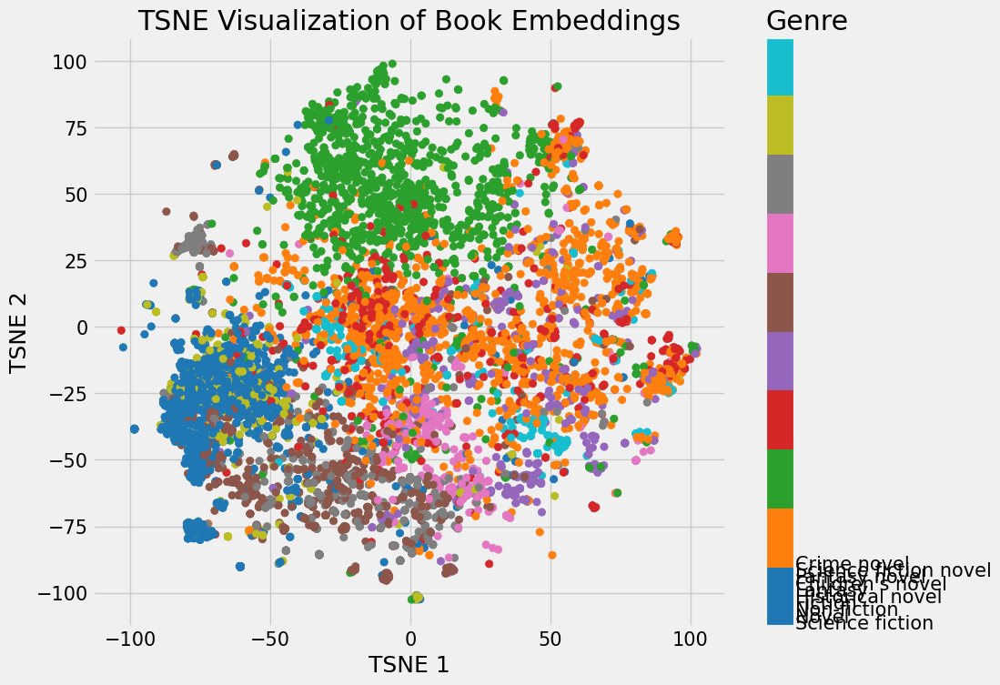

In [ ]:
plt.figure(figsize = (10, 8))

# Plot embedding
plt.scatter(book_r[idx_include, 0], book_r[idx_include, 1],
            c = ints, cmap = plt.cm.tab10)

# Add colorbar and appropriate labels
cbar = plt.colorbar()
cbar.set_ticks([])
for j, lab in enumerate(gen):
    cbar.ax.text(1, (2 * j + 1) / ((10) * 2), lab, ha='left', va='center')
cbar.ax.set_title('Genre', loc = 'left')


plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2'); plt.title('TSNE Visualization of Book Embeddings');

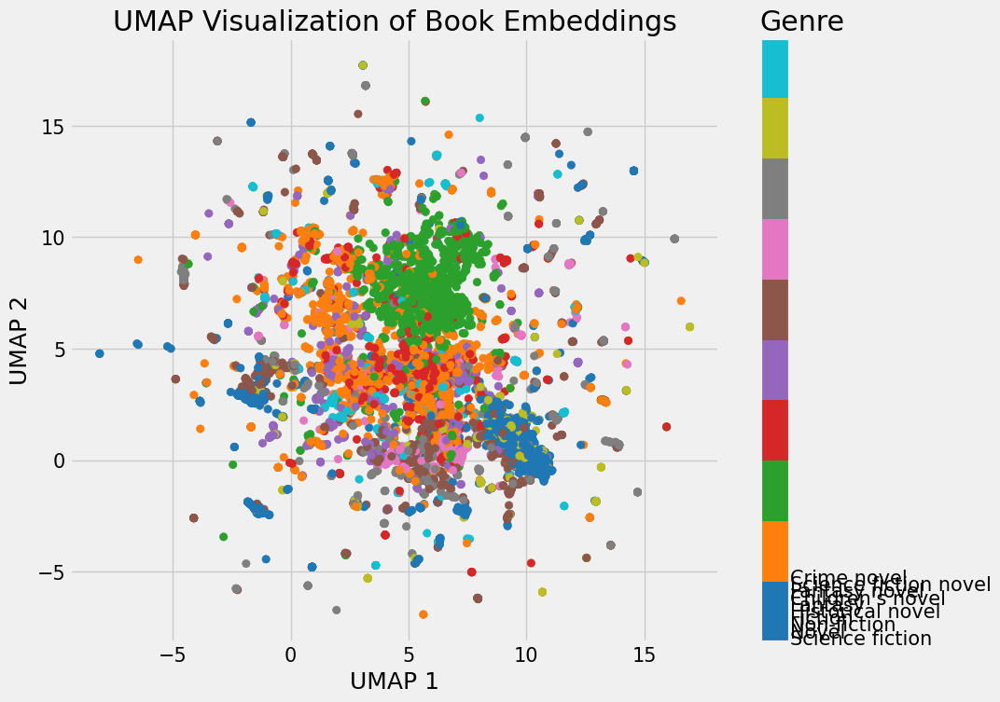

In [ ]:
plt.figure(figsize = (10, 8))

# Plot embedding
plt.scatter(book_ru[idx_include, 0], book_ru[idx_include, 1],
            c = ints, cmap = plt.cm.tab10)

# Add colorbar and appropriate labels
cbar = plt.colorbar()
cbar.set_ticks([])
for j, lab in enumerate(gen):
    cbar.ax.text(1, (2 * j + 1) / ((10) * 2), lab, ha='left', va='center')
cbar.ax.set_title('Genre', loc = 'left')


plt.xlabel('UMAP 1'); plt.ylabel('UMAP 2'); plt.title('UMAP Visualization of Book Embeddings');

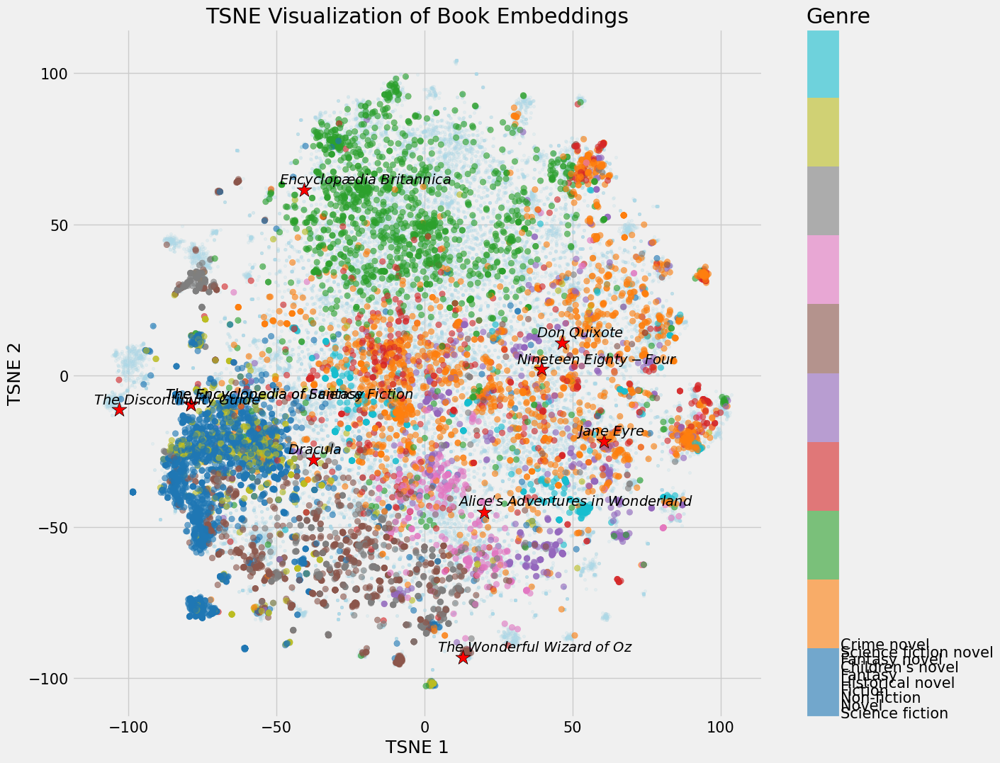

In [ ]:
plt.figure(figsize = (14, 12))

# Plot all books
plt.scatter(book_r[:, 0], book_r[:, 1], marker = '.', color = 'lightblue', alpha = 0.2)

# Plot genres
plt.scatter(book_r[idx_include, 0], book_r[idx_include, 1],
            c = ints, cmap = plt.cm.tab10, alpha = 0.6)

# Add colorbar and appropriate labels
cbar = plt.colorbar()
cbar.set_ticks([])
for j, lab in enumerate(gen):
    cbar.ax.text(1, (2 * j + 1) / ((10) * 2), lab, ha='left', va='center')

cbar.ax.set_title('Genre', loc = 'left')
plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2'); plt.title('TSNE Visualization of Book Embeddings');

for book in list(wikilink_book_counts.keys())[:10]:

    x, y = book_r[book_index[book], 0], book_r[book_index[book], 1];
    # Italize book title using latex
    s =  ''.join([' $\it{' + word + '}$' for word in book.split()])
    _ = plt.scatter(x, y, s = 250, color = 'r',
                    marker = '*', edgecolor = 'k')
    _ = plt.text(x - 10, y + 2, s, fontsize = 14);

In [ ]:
book_r[book_index['The Encyclopedia of Science Fiction']]

array([-79.02618 ,  -9.383295], dtype=float32)

In [ ]:
book_r[book_index['The Encyclopedia of Fantasy']]

array([-79.04052 ,  -9.387598], dtype=float32)

In [ ]:
def plot_by_attribute(attribute):
    """Color book embedding by `attribute`"""
    # Find all the attribute values
    attrs = [book[1].get(attribute, 0) for book in books]

    # Remove attributes not found
    attr_counts = count_items(attrs)
    del attr_counts[0]

    # Include 10 most popular attributes
    attr_to_include, counts = list(attr_counts.keys())[:10], list(attr_counts.values())[:10]

    idx_include = []
    attributes = []

    # Iterate through books searching for the attribute
    for i, book in enumerate(books):
        # Limit to books with the attribute
        if attribute in book[1].keys():
            # Limit to attribute in the 10 most popular
            if book[1][attribute] in attr_to_include:
                idx_include.append(i)
                attributes.append(book[1][attribute])

    # Map to integers
    ints, attrs = pd.factorize(attributes)
    plt.figure(figsize = (12, 10))

    plt.scatter(book_r[:, 0], book_r[:, 1], marker = '.', color = 'lightblue', alpha = 0.2)

    # Plot embedding with only specific attribute highlighted
    plt.scatter(book_r[idx_include, 0], book_r[idx_include, 1], alpha = 0.6,
                c = ints, cmap = plt.cm.tab10, marker = 'o', s = 50)

    # Add colorbar and appropriate labels
    cbar = plt.colorbar()
    cbar.set_ticks([])
    tick_labels = [f'{attr}: {count}' for attr, count in zip(attr_to_include, counts)]
    # Labeling
    for j, lab in enumerate(tick_labels):
        cbar.ax.text(1, (2 * j + 1) / ((10) * 2), lab, ha='left', va='center')
    cbar.ax.set_title(f'{attribute.capitalize()}: Count', loc = 'left')


    plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2'); plt.title(f'Book Embeddings with {attribute.capitalize()}');

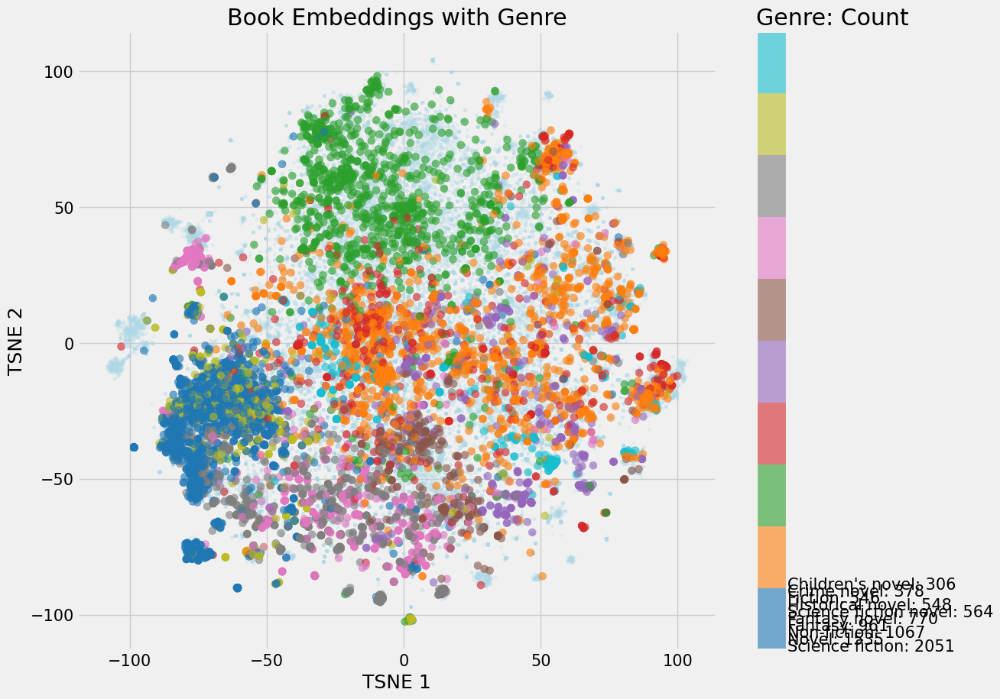

In [ ]:
plot_by_attribute('genre')

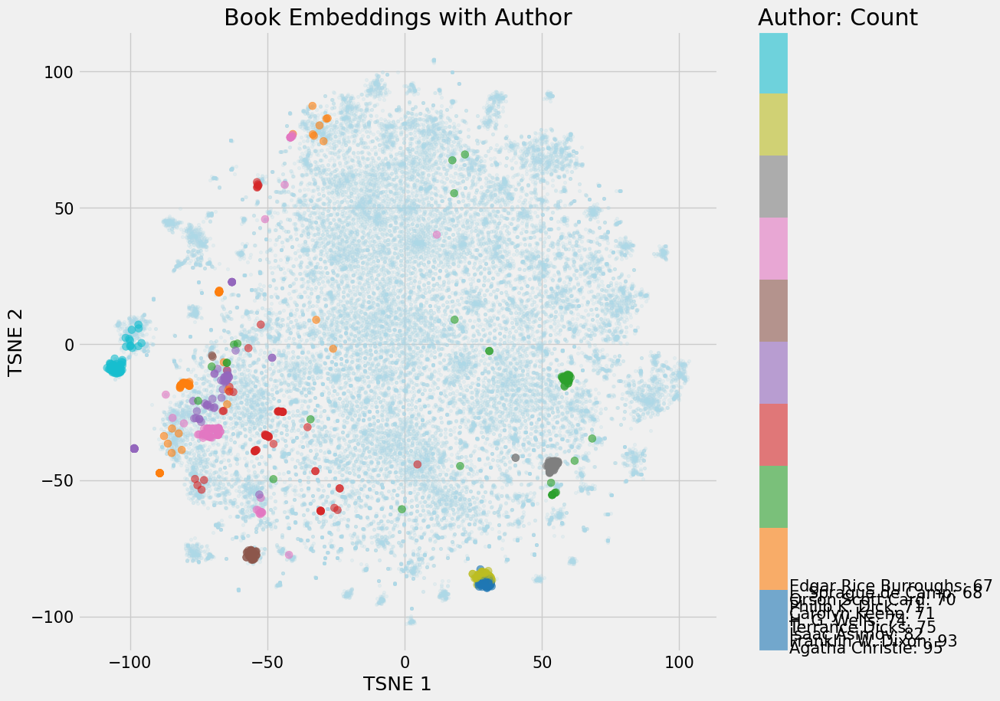

In [ ]:
plot_by_attribute('author')

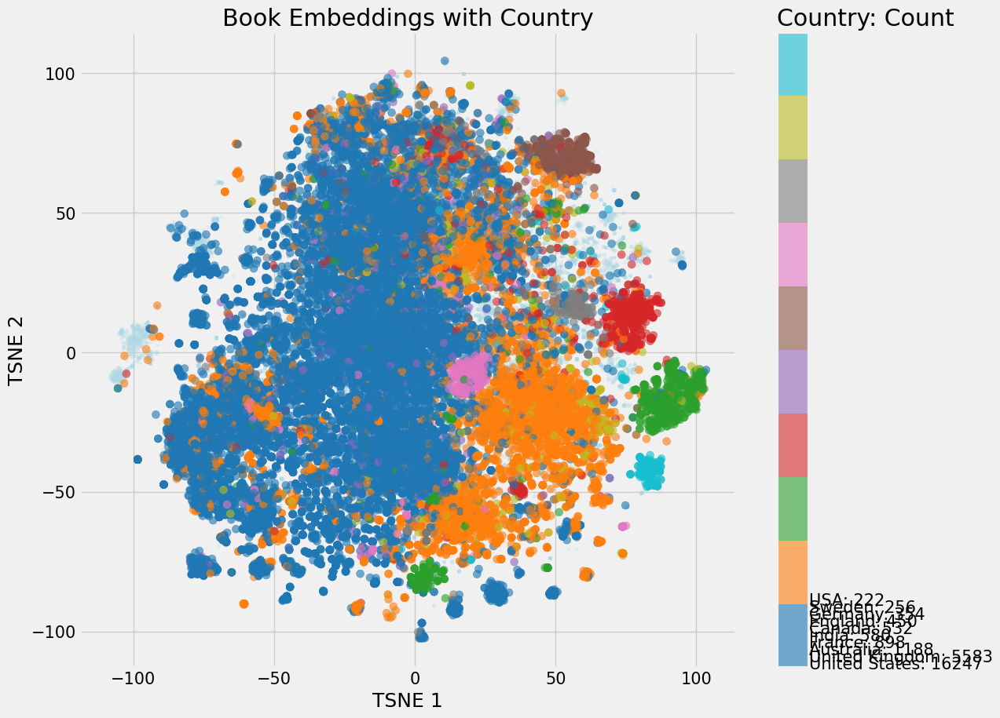

In [ ]:
plot_by_attribute('country')

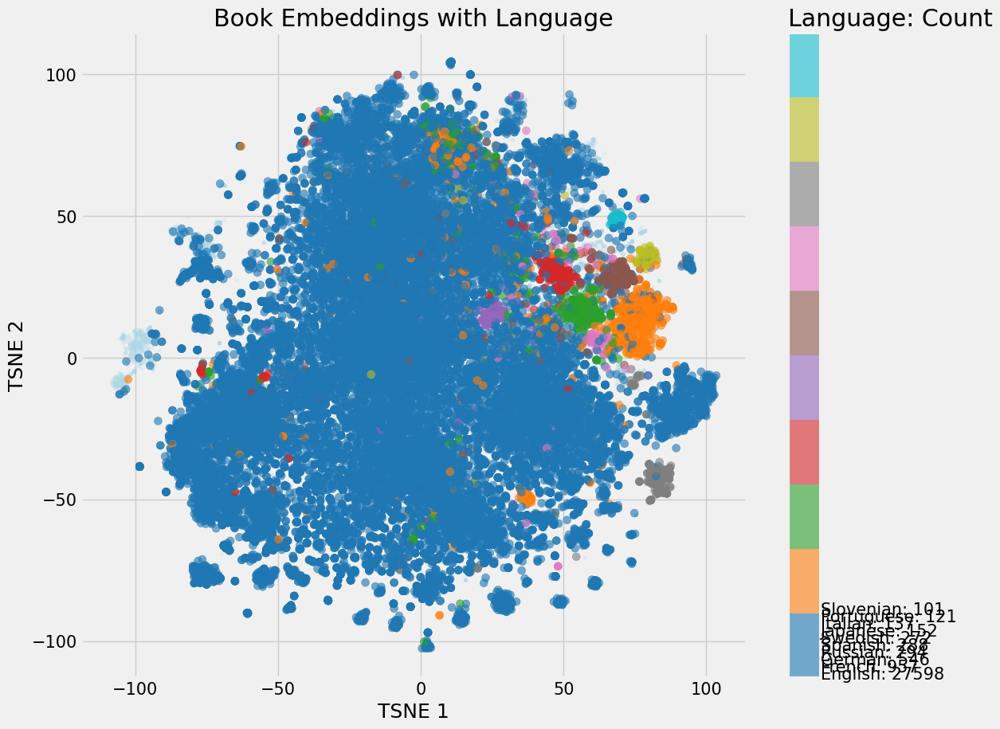

In [ ]:
plot_by_attribute('language')

In [ ]:
def plot_closest(item, weights, index_name, n, plot_data):
    """Plot n most closest items to item"""

    # Find the closest items
    dist, closest = find_similar(item, weights, index_name, n, return_dist=True)

    # Choose mapping for look up
    if index_name == 'book':
        index = book_index
        rindex = index_book
    elif index_name == 'page':
        index = link_index
        rindex = index_link

    plt.figure(figsize = (10, 9))
    plt.rcParams['font.size'] = 14

    # Limit distances
    dist = dist[closest]

    # Plot all of the data
    plt.scatter(plot_data[:, 0], plot_data[:, 1], alpha = 0.1, color = 'goldenrod')

    # Plot the item
    plt.scatter(plot_data[closest[-1], 0], plot_data[closest[-1], 1], s = 600, edgecolor = 'k', color = 'forestgreen')

    # Plot the closest items
    p = plt.scatter(plot_data[closest[:-1], 0], plot_data[closest[:-1], 1],
                c = dist[:-1], cmap = plt.cm.RdBu_r, s = 200, alpha = 1, marker = '*')

    # Colorbar management
    cbar = plt.colorbar()
    cbar.set_ticks([])

    tick_labels = []
    # Tick labeling for colorbar
    for idx, distance in zip(closest[:-1], dist[:-1]):
        name_str = ''
        for word in rindex[idx].split():
            # Title uses latex for italize
            name_str += ' $\it{' + word + '}$'
        name_str += ': ' + str(round(distance, 2))
        tick_labels.append(name_str)

    for j, lab in enumerate(tick_labels):
        cbar.ax.text(1, (2 * j + 1) / ((n - 1) * 2), lab, ha='left', va='center', size = 12)
    cbar.ax.set_title(f'{index_name.capitalize()} and Cosine Distance', loc = 'left', size = 14)

    # Formatting for italicized title
    name_str = f'{index_name.capitalize()}s Most Similar to'
    for word in item.split():
        # Title uses latex for italize
        name_str += ' $\it{' + word + '}$'

    # Labeling
    plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2');
    plt.title(name_str);

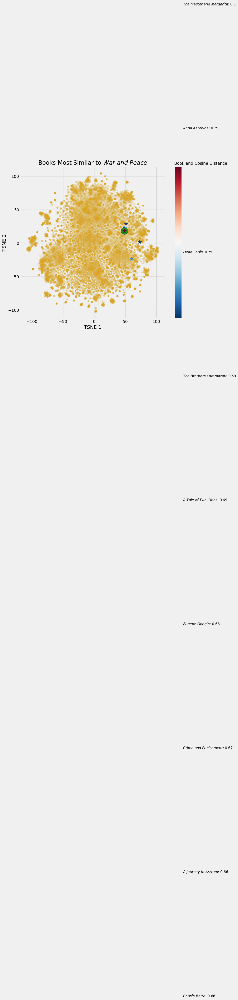

In [ ]:
plot_closest('War and Peace', book_weights_class, 'book', 10, book_r)

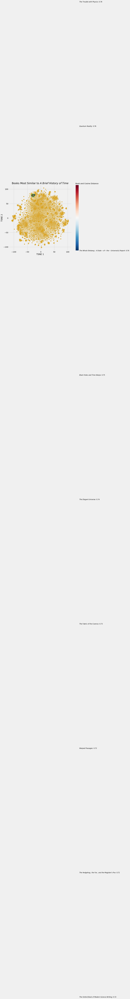

In [ ]:
plot_closest('A Brief History of Time', book_weights_class, 'book', 10, book_r)

In [ ]:
link_r = reduce_dim(link_weights_class, components = 2, method = 'tsne')
link_r.shape

(41758, 2)

In [ ]:
idx_to_include = [idx for link, idx in link_index.items() if 'category:' in link]

categories = []

for book in books:
    for link in book[2]:
        if 'category:' in link.lower():
            categories.append(link)

c_counts = count_items(categories)
list(c_counts.items())[:5]

[('Category:American science fiction novels', 1289),
 ('Category:American novels adapted into films', 1139),
 ('Category:Debut novels', 1072),
 ('Category:American fantasy novels', 1036),
 ('Category:American young adult novels', 956)]

In [ ]:
idx = []

# Find the index of the most popular links
for link in list(c_counts.keys())[:10]:
    link_idx = link_index[link.lower()]

    # Find index of category
    index = int(np.where(np.array(idx_to_include) == link_idx)[0])
    idx.append(index)

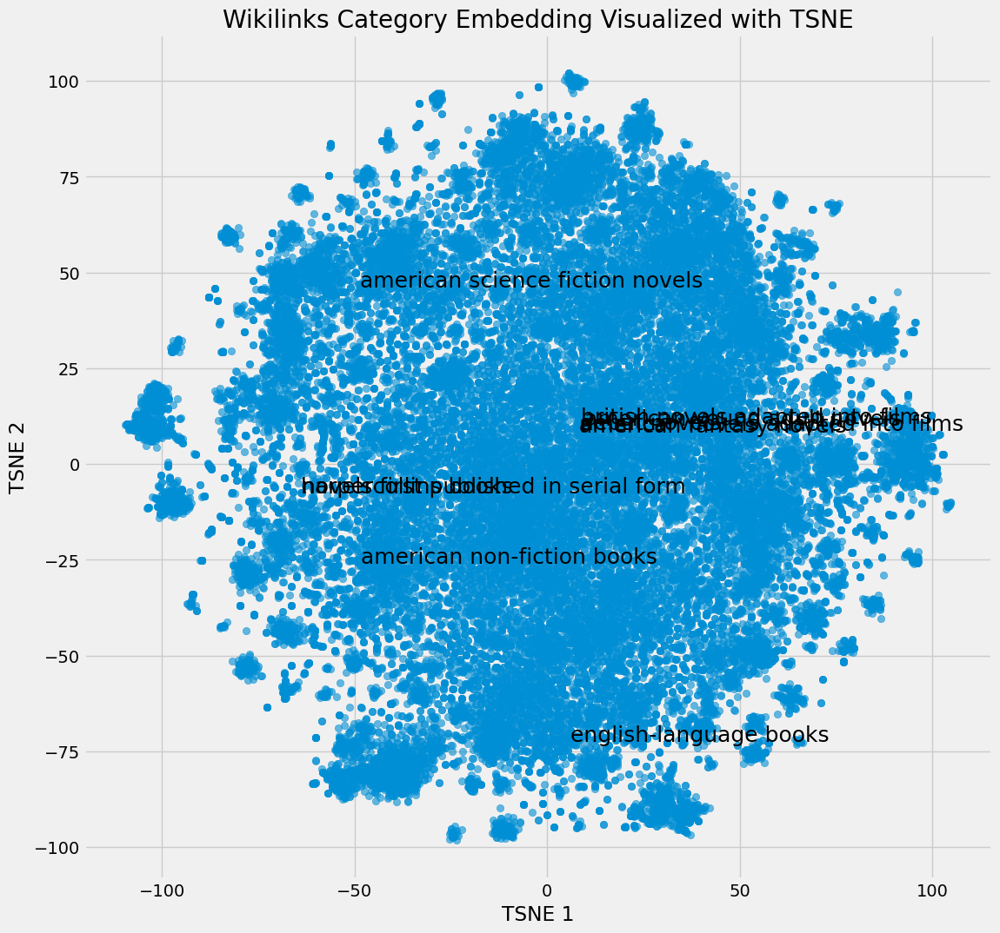

In [ ]:
plt.figure(figsize = (12, 12))
plt.scatter(link_r[:, 0], link_r[:, 1], alpha = 0.6)

for i in idx:
    x, y = link_r[i, 0], link_r[i, 1]
    s = index_link[idx_to_include[i]].split(':')[-1]
    _ = plt.text(x, y, s, fontsize = 18);

plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2'); plt.title('Wikilinks Category Embedding Visualized with TSNE');

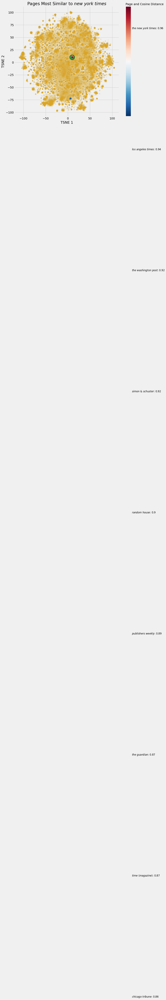

In [ ]:
plot_closest('new york times', link_weights_class, 'page', 10, link_r)

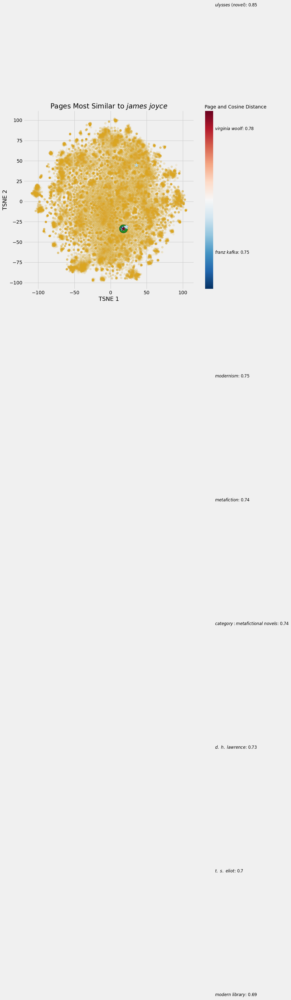

In [ ]:
plot_closest('james joyce', link_weights_class, 'page', 10, link_r)

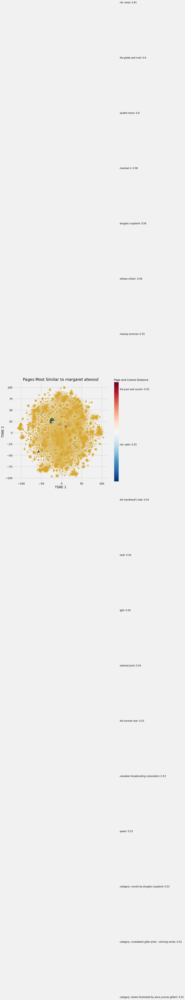

In [ ]:
plot_closest('margaret atwood', link_weights_class, 'page', 20, link_r)

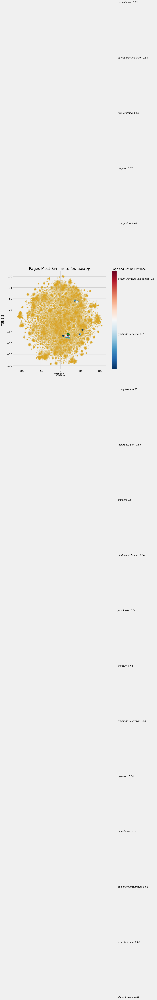

In [ ]:
plot_closest('leo tolstoy', link_weights_class, 'page', 20, link_r)

In [ ]:
def plot_groups(items, weights, embed, index_name = 'book', n = 5):
    closest = []
    dists = []

    # Select index and reverse index
    if index_name == 'book':
        index = book_index
        rindex = index_book
    elif index_name == 'page':
        index = link_index
        rindex = index_link

    for item in items:
        d, c = find_similar(item, weights, index_name, n, return_dist = True)
        d = d[c]
        closest.extend(c)
        dists.extend(d)

    ax = plt.figure(figsize = (10, 8))
    p = plt.scatter(embed[:, 0], embed[:, 1], alpha = 0.2, marker = 'o', color =  'lightblue')

    cmap = plt.cm.get_cmap('tab10_r', len(items))
    color_list = []

    for i, item in enumerate(items):
         # Plot the item
        plt.scatter(embed[index[item], 0], embed[index[item], 1],
                    s = 200, alpha = 0.4, edgecolor = 'k', color = cmap(i))
        color_list.extend(i for _ in range(n))

    p = plt.scatter(embed[closest, 0], embed[closest, 1], c = color_list, cmap = cmap, s = 150,
                    marker = '*', alpha = 0.8)


    cbar = plt.colorbar(p)
    cbar.set_ticks([])

    tick_labels = []
    # Tick labeling for colorbar
    for item in items:
        name_str = ''
        for word in item.split():
            # Title uses latex for italize
            name_str += ' $\it{' + word + '}$'
        tick_labels.append(name_str)

    for j, lab in enumerate(tick_labels):
        cbar.ax.text(1, (2 * j + 1) / (len(items) * 2), lab, ha='left', va='center', size = 12)
    cbar.ax.set_title(f'Highlighted {index_name.capitalize()}s', loc = 'left', size = 14)
    plt.xlabel('TSNE 1'); plt.ylabel('TSNE 2'); plt.title(f'Embedded {index_name.capitalize()}s with Closest Neighbors');

<ipython-input-111-6aa1f0216672>:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10_r', len(items))


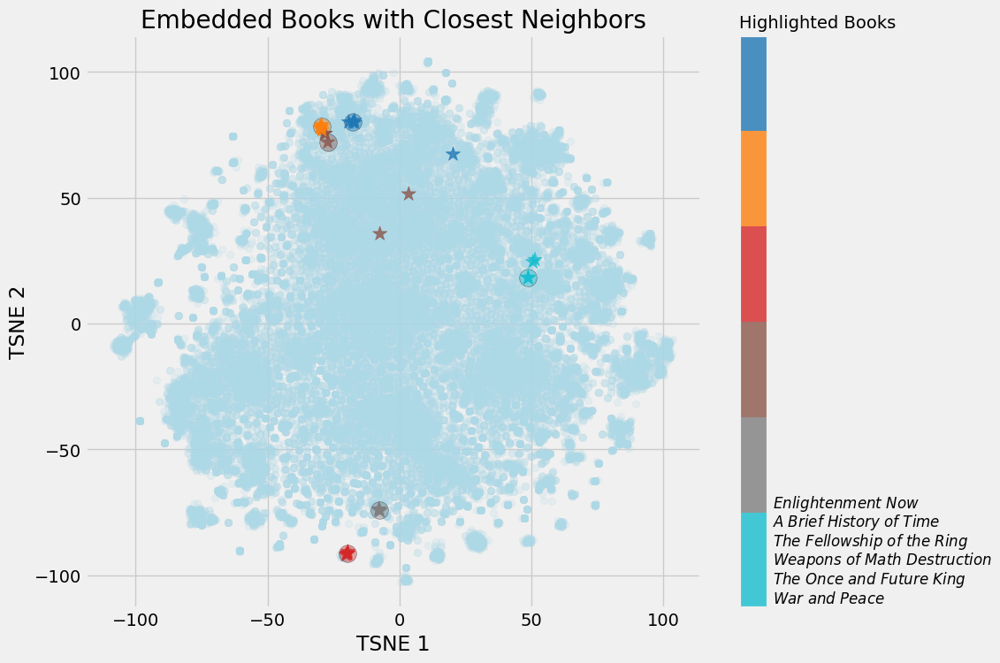

In [ ]:
plot_groups(['War and Peace', "The Once and Future King",
             "Weapons of Math Destruction", "The Fellowship of the Ring",
             "A Brief History of Time", "Enlightenment Now"],
            book_weights_class, book_r, 'book')

<ipython-input-111-6aa1f0216672>:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10_r', len(items))


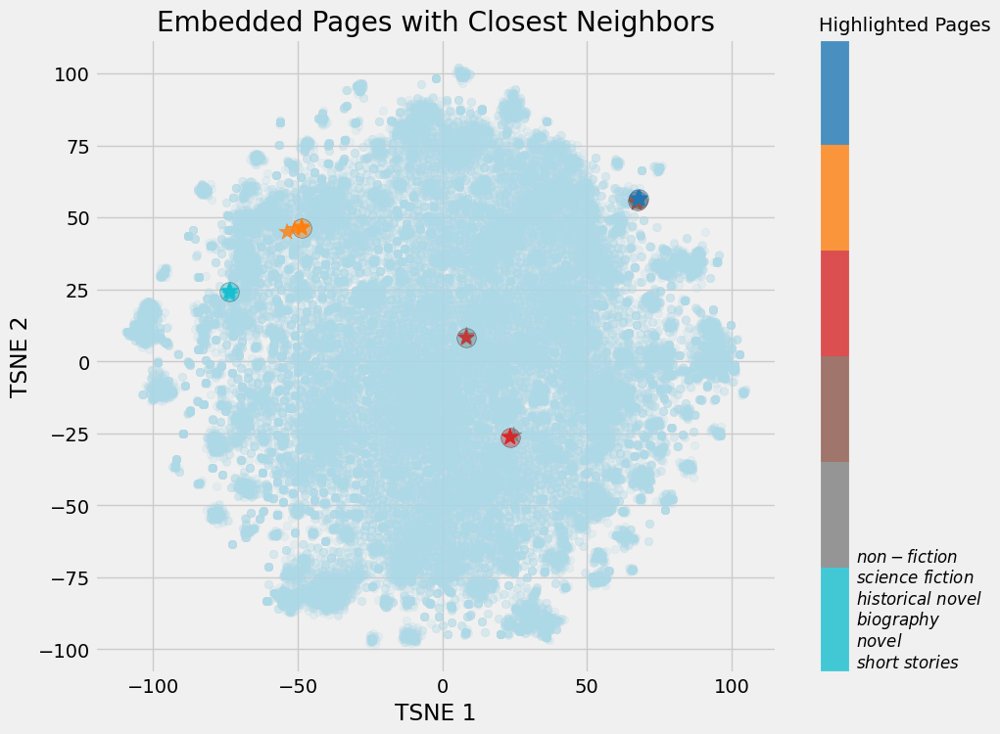

In [ ]:
plot_groups(['short stories', 'novel',
            'biography', 'historical novel',
             'science fiction', 'non-fiction'],
            link_weights_class, link_r, 'page')

<ipython-input-114-e378d0ebd493>:2: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  plot_groups(list(random.sample(book_index.keys(), 6)),
<ipython-input-111-6aa1f0216672>:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10_r', len(items))


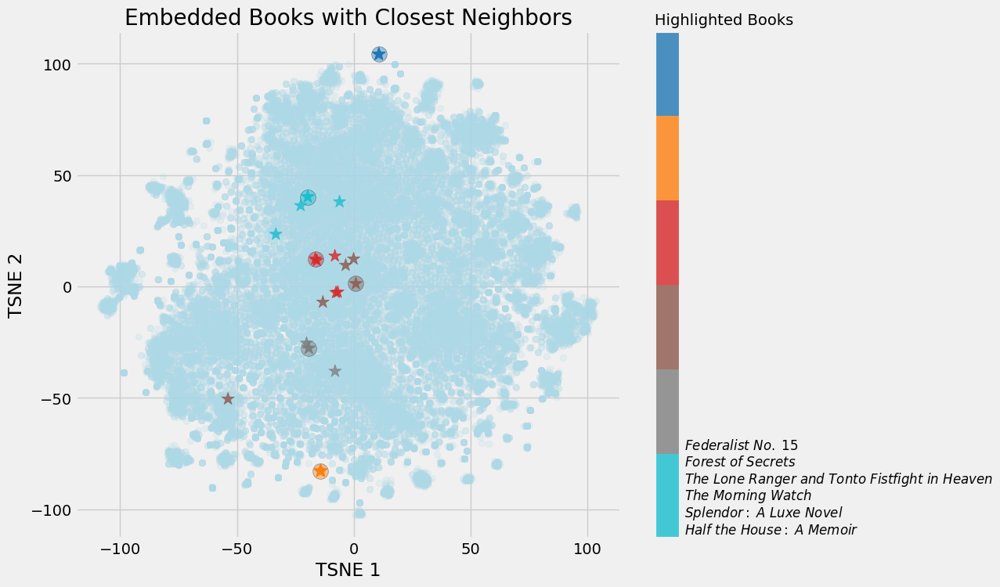

In [ ]:
random.seed(150)
plot_groups(list(random.sample(book_index.keys(), 6)),
            book_weights_class, book_r, 'book')

<ipython-input-115-37db1e65900d>:2: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  plot_groups(list(random.sample(link_index.keys(), 6)), link_weights_class, link_r, 'page')
<ipython-input-111-6aa1f0216672>:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10_r', len(items))


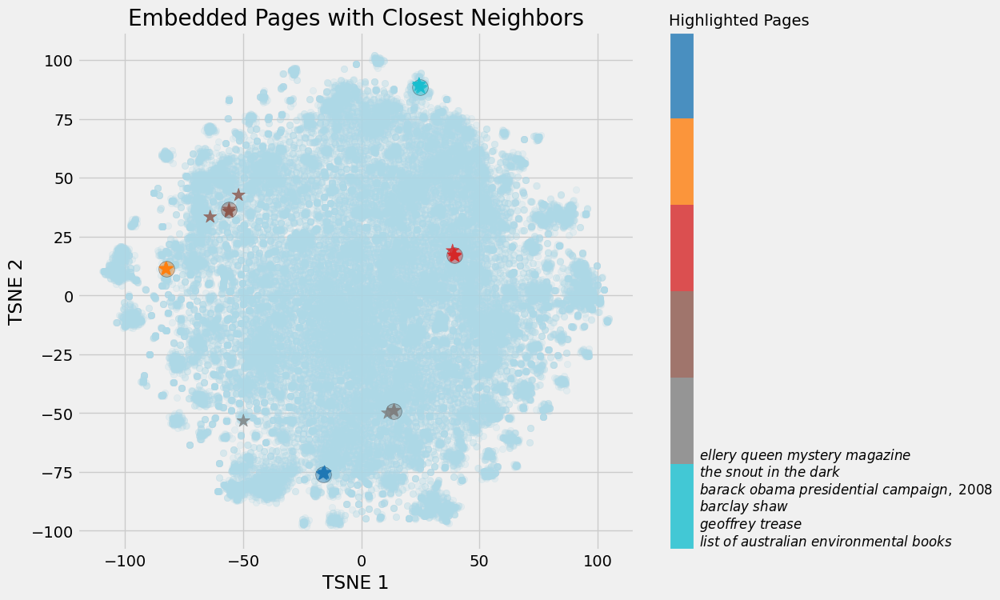

In [ ]:
random.seed(150)
plot_groups(list(random.sample(link_index.keys(), 6)), link_weights_class, link_r, 'page')

In [ ]:
%%capture
with open('/content/drive/MyDrive/Embedding/link_embedding.tsv', 'w' , encoding = 'utf-8') as fout:
    for l in link_index.keys():
        fout.write(str(l))
        fout.write('\n')

In [ ]:
import re
pattern = re.compile('[\\n]|<.*?>')
pattern.sub('', 'bill moushey \n < br >').strip()

'bill moushey'

In [ ]:
import re
pattern = re.compile('[\\n]|<.*?>')

# Extract book metadata
authors = []
genres = []
pages = []
languages = []
countries = []
publishers = []


for book in books:
    info = book[1]
    for attr, l in zip(['author', 'genre', 'pages', 'langauge', 'country', 'publisher'],
                        [authors, genres, pages, languages, countries, publishers]):
        l.append(pattern.sub('', info.get(attr, 'None').lower()).strip())

book_info = pd.DataFrame({'author': authors, 'genre': genres, 'pages': pages,
                          'language': languages, 'country': countries,
                          'publisher': publishers}, index = list(book_index.keys()))

book_info = book_info.replace({'none': np.nan})
book_info.index.name = 'title'
book_info.head()

,author,genre,pages,language,country,publisher
title,,,,,,
Freud: His Life and His Mind,helen walker puner,NaN,288 (1959 edition),NaN,united states,dell publishing
Blackbox (novel),nick walker,NaN,NaN,NaN,united kingdom,harpercollins
My Real Children,jo walton,"fantasy literature, alternate history",320 pp.,NaN,united states,tor books
The Alleys of Eden,robert olen butler,NaN,251 pp,NaN,united states,NaN
Day of the Dogs,andrew cartmel,science fiction,256,NaN,NaN,black flame


In [ ]:
book_info.to_csv('/content/drive/MyDrive/Embedding/book_info.tsv', sep = '\t')

In [ ]:
np.savetxt('/content/drive/MyDrive/Embedding/book_embedding.tsv', book_weights_class, delimiter='\t')
np.savetxt('/content/drive/MyDrive/Embedding/link_embedding.tsv', link_weights_class, delimiter='\t')

In [ ]:
book_embedding = np.loadtxt('/content/drive/MyDrive/Embedding/book_embedding.tsv', delimiter = '\t')
book_embedding.shape

(37020, 50)